# BHA2 Exploratory Data Analysis

## Setup 

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from env.imports import *

/ext3/miniconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
2025-07-09 13:06:59.697761: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-09 13:07:01.690327: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-09 13:07:03.825392: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
  import numpy.matlib as npm

  au

In [3]:
from models import *
from data import * 
from env import *
from sim import *

# data load
from data.data_load import load_transcriptome, load_connectome, load_coords
from data.data_viz import plot_connectome, plot_connectome_with_labels, plot_transcriptome

import sys


### Paths and metadata

In [4]:
# Set paths
GeneEx2Conn_path = os.path.normpath(os.getcwd())
BHA2_path = os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/BHA2'
BHA2_183_path = BHA2_path + '/iPA_183'
BHA2_391_path = BHA2_path + '/iPA_391'
BHA2_729_path = BHA2_path + '/iPA_729'
print(GeneEx2Conn_path)
print(BHA2_path)

BHA2_demographics = pd.read_csv(BHA2_path + '/participants.tsv', sep='\t')
unique_subject_ids = BHA2_demographics['ID'].str.split('-').str[1].tolist()
print(f"Number of subjects: {len(unique_subject_ids)}")
print(f"Age distribution: {BHA2_demographics['Age'].value_counts().to_dict()}")
print(f"Gender distribution: {BHA2_demographics['Gender_ 1=female_2=male'].value_counts().to_dict()}")

# Load and process iPA_183 parcellation
iPA_183_path = BHA2_183_path + '/iPA_183.csv'
iPA_183_info = pd.read_csv(iPA_183_path)

# Create labels and network labels for iPA_183
iPA_183_labels = [f'ROI_{i}' for i in range(1, 184)]
iPA_183_network_labels = []

for _, row in iPA_183_info.iterrows():
    # Get the region with maximum probability
    region_probs = {
        'Frontal': row['Frontal_L'] + row['Frontal_R'],
        'Insula': row['Insula_L'] + row['Insula_R'],
        'Occipital': row['Occipital_L'] + row['Occipital_R'],
        'Parietal': row['Parietal_L'] + row['Parietal_R'],
        'Subcortical': row['Subcortical_L'] + row['Subcortical_R'],
        'Temporal': row['Temporal_L'] + row['Temporal_R']
    }
    network = max(region_probs.items(), key=lambda x: x[1])[0]
    iPA_183_network_labels.append(network)

# Load and process iPA_391 parcellation  
iPA_391_path = BHA2_391_path + '/iPA_391.csv'
iPA_391_info = pd.read_csv(iPA_391_path)

# Create labels and network labels for iPA_391
iPA_391_labels = [f'ROI_{i}' for i in range(1, 392)]
iPA_391_network_labels = []

for _, row in iPA_391_info.iterrows():
    region_probs = {
        'Frontal': row['Frontal_L'] + row['Frontal_R'],
        'Insula': row['Insula_L'] + row['Insula_R'], 
        'Occipital': row['Occipital_L'] + row['Occipital_R'],
        'Parietal': row['Parietal_L'] + row['Parietal_R'],
        'Subcortical': row['Subcortical_L'] + row['Subcortical_R'],
        'Temporal': row['Temporal_L'] + row['Temporal_R']
    }
    network = max(region_probs.items(), key=lambda x: x[1])[0]
    iPA_391_network_labels.append(network)

# Load and process iPA_729 parcellation
iPA_729_path = BHA2_729_path + '/iPA_729.csv'
iPA_729_info = pd.read_csv(iPA_729_path)

# Create labels and network labels for iPA_729
iPA_729_labels = [f'ROI_{i}' for i in range(1, 730)]
iPA_729_network_labels = []

for _, row in iPA_729_info.iterrows():
    region_probs = {
        'Frontal': row['Frontal_L'] + row['Frontal_R'],
        'Insula': row['Insula_L'] + row['Insula_R'],
        'Occipital': row['Occipital_L'] + row['Occipital_R'], 
        'Parietal': row['Parietal_L'] + row['Parietal_R'],
        'Subcortical': row['Subcortical_L'] + row['Subcortical_R'],
        'Temporal': row['Temporal_L'] + row['Temporal_R']
    }
    network = max(region_probs.items(), key=lambda x: x[1])[0]
    iPA_729_network_labels.append(network)

/scratch/asr655/neuroinformatics/GeneEx2Conn
/scratch/asr655/neuroinformatics/GeneEx2Conn_data/BHA2
Number of subjects: 136
Age distribution: {'20-25': 76, '25-30': 60}
Gender distribution: {2: 98, 1: 38}


In [5]:
# Print information about iPA_183 parcellation
print("\niPA_183 Parcellation Info:")
print(f"Number of ROIs: {len(iPA_183_labels)}")
print("\nNetwork distribution:")
network_counts = pd.Series(iPA_183_network_labels).value_counts()
for network, count in network_counts.items():
    print(f"{network}: {count} ROIs ({count/len(iPA_183_labels)*100:.1f}%)")


iPA_183 Parcellation Info:
Number of ROIs: 183

Network distribution:
Frontal: 67 ROIs (36.6%)
Parietal: 41 ROIs (22.4%)
Temporal: 34 ROIs (18.6%)
Occipital: 27 ROIs (14.8%)
Subcortical: 11 ROIs (6.0%)
Insula: 3 ROIs (1.6%)


## Load data

### Load all subjects and generate population average connectomes

In [6]:
def compute_BHA2_population_average_connectome(subject_list, data_path, atlas_name='183', verbose=True):
    """
    Compute population average connectome from a list of subjects.
    
    Parameters
    ----------
    subject_list : list
        List of subject IDs (e.g. ['032311', '032309', etc])
    data_path : str
        Path to data directory
    atlas_name : str, optional
        Atlas to use ('183', '391', '568', or '729'), by default '183'
    verbose : bool, optional
        Whether to print progress, by default True
        
    Returns
    -------
    tuple
        (population average connectome matrix,
         list of individual subject connectomes)
    """
    # Validate atlas name
    valid_atlases = ['183', '391', '568', '729']
    if atlas_name not in valid_atlases:
        raise ValueError(f"Unsupported atlas_name: {atlas_name}. Must be one of {valid_atlases}")

    # Initialize list to store connectomes
    connectomes = []
    n_skipped = 0

    # Collect all valid connectomes
    for i, subject_id in enumerate(subject_list):
        if verbose and i % 100 == 0:
            print(f"Loading subject {i}/{len(subject_list)}")
            
        # Get connectome path using 6-digit subject ID format
        fc_path = os.path.join(data_path, f'iPA_{atlas_name}', 'fc', f'fc_sub-{subject_id}.csv')
        
        try:
            # Load connectome - data is space-separated with no header
            curr_mat = pd.read_csv(fc_path, sep=' ', header=None).values
            connectomes.append(curr_mat)
        except Exception as e:
            if verbose:
                print(f"Error processing subject {subject_id}: {str(e)}")
            n_skipped += 1
            continue

    # Count connectomes with NaN values
    nan_count = sum(np.any(np.isnan(conn)) for conn in connectomes)
    if verbose:
        print(f"Number of connectomes with NaN values: {nan_count} out of {len(connectomes)} total connectomes")
        print(f"Number of subjects skipped: {n_skipped}")

    # Compute average
    pop_avg = np.nanmean(connectomes, axis=0)
    
    return pop_avg, connectomes

In [7]:
unique_subject_ids

['032311',
 '032309',
 '032382',
 '032302',
 '032315',
 '032314',
 '032316',
 '032307',
 '032310',
 '032312',
 '032317',
 '032404',
 '032319',
 '032386',
 '032320',
 '032322',
 '032394',
 '032324',
 '032323',
 '032528',
 '032325',
 '032313',
 '032405',
 '032384',
 '032407',
 '032327',
 '032414',
 '032418',
 '032326',
 '032332',
 '032346',
 '032350',
 '032351',
 '032356',
 '032358',
 '032446',
 '032421',
 '032357',
 '032361',
 '032363',
 '032364',
 '032353',
 '032365',
 '032349',
 '032366',
 '032344',
 '032359',
 '032355',
 '032352',
 '032360',
 '032367',
 '032448',
 '032371',
 '032345',
 '032354',
 '032330',
 '032449',
 '032460',
 '032385',
 '032464',
 '032388',
 '032387',
 '032469',
 '032471',
 '032389',
 '032390',
 '032472',
 '032467',
 '032470',
 '032478',
 '032476',
 '032480',
 '032399',
 '032401',
 '032398',
 '032477',
 '032396',
 '032400',
 '032468',
 '032473',
 '032402',
 '032403',
 '032397',
 '032406',
 '032408',
 '032500',
 '032409',
 '032499',
 '032410',
 '032503',
 '032411',

In [8]:
BHA2_183_connectome_mu, BHA2_183_connectomes = compute_BHA2_population_average_connectome(
    subject_list=unique_subject_ids,
    atlas_name='183',
    data_path=BHA2_path
)

Loading subject 0/136
Loading subject 100/136
Number of connectomes with NaN values: 0 out of 136 total connectomes
Number of subjects skipped: 0


In [9]:
BHA2_391_connectome_mu, BHA2_391_connectomes = compute_BHA2_population_average_connectome(
    subject_list=unique_subject_ids,
    atlas_name='391',
    data_path=BHA2_path
)

Loading subject 0/136
Loading subject 100/136
Number of connectomes with NaN values: 0 out of 136 total connectomes
Number of subjects skipped: 0


In [10]:
BHA2_729_connectome_mu, BHA2_729_connectomes = compute_BHA2_population_average_connectome(
    subject_list=unique_subject_ids,
    atlas_name='729',
    data_path=BHA2_path
)

Loading subject 0/136
Loading subject 100/136
Number of connectomes with NaN values: 0 out of 136 total connectomes
Number of subjects skipped: 0


In [11]:
BHA2_183_connectome_mean = np.array(pd.read_csv(BHA2_183_path + '/fc/fc_mean.csv', header=None).values, dtype=float)
BHA2_391_connectome_mean = np.array(pd.read_csv(BHA2_391_path + '/fc/fc_mean.csv', header=None).values, dtype=float)
BHA2_729_connectome_mean = np.array(pd.read_csv(BHA2_729_path + '/fc/fc_mean.csv', header=None).values, dtype=float)

print(BHA2_183_connectome_mean.shape)
print(BHA2_391_connectome_mean.shape)
print(BHA2_729_connectome_mean.shape)

tol = 1e-10
is_equal_183 = np.allclose(BHA2_183_connectome_mean, BHA2_183_connectome_mu, rtol=tol, atol=tol, equal_nan=True)
print("\nBHA2-183 connectomes identical:", is_equal_183)
if not is_equal_183:
    print(f"Max difference: {np.nanmax(np.abs(BHA2_183_connectome_mean - BHA2_183_connectome_mu))}")

is_equal_391 = np.allclose(BHA2_391_connectome_mean, BHA2_391_connectome_mu, rtol=tol, atol=tol, equal_nan=True)
print("\nBHA2-391 connectomes identical:", is_equal_391)
if not is_equal_391:
    print(f"Max difference: {np.nanmax(np.abs(BHA2_391_connectome_mean - BHA2_391_connectome_mu))}")

is_equal_729 = np.allclose(BHA2_729_connectome_mean, BHA2_729_connectome_mu, rtol=tol, atol=tol, equal_nan=True)
print("\nBHA2-729 connectomes identical:", is_equal_729)
if not is_equal_729:
    print(f"Max difference: {np.nanmax(np.abs(BHA2_729_connectome_mean - BHA2_729_connectome_mu))}")


(183, 183)
(391, 391)
(729, 729)

BHA2-183 connectomes identical: True

BHA2-391 connectomes identical: True

BHA2-729 connectomes identical: True


In [12]:
def extract_upper_triangle_with_mask(matrix):
    """Extracts upper triangle and returns a mask of valid (non-NaN) values."""
    upper_triangle = matrix[np.triu_indices_from(matrix, k=1)]
    mask = ~np.isnan(upper_triangle)  # True if the value is NOT NaN
    return upper_triangle, mask

def process_connectome_data(connectomes, subjects, save_path=None):
    """Process connectome data for a given parcellation.
    
    Args:
        connectomes: List of connectivity matrices
        subjects: List of subject IDs
        save_path: Optional path to save processed data as .npy files
        
    Returns:
        Dictionary containing processed data
    """
    # Process connectomes
    connectomes_upper = []
    masks = []

    for matrix in connectomes:
        upper_tri, mask = extract_upper_triangle_with_mask(matrix)
        connectomes_upper.append(upper_tri)
        masks.append(mask)

    connectomes_upper = np.array(connectomes_upper)
    masks = np.array(masks)

    print(f"Connectomes shape: {connectomes_upper.shape}")
    print(f"Masks shape: {masks.shape}")

    # Create data dictionary
    data = {
        'subject_ids': subjects[:len(connectomes)],
        'connectomes_upper': connectomes_upper,
        'masks': masks
    }

    print(f"Data structure created with {len(data['subject_ids'])} subjects")

    # Calculate memory size in MB
    data_size_mb = (data['connectomes_upper'].nbytes + 
                    data['masks'].nbytes + 
                    sum(sys.getsizeof(id) for id in data['subject_ids'])) / (1024 * 1024)

    print(f"Dataset size: {data_size_mb:.2f} MB")

    # Save data if path provided
    if save_path:
        # Create npy directory if it doesn't exist
        npy_dir = os.path.join(save_path, 'npy')
        os.makedirs(npy_dir, exist_ok=True)

        # Save data
        np.save(f'{npy_dir}/connectomes_upper.npy', data['connectomes_upper'])
        np.save(f'{npy_dir}/masks.npy', data['masks'])
        np.save(f'{npy_dir}/subject_ids.npy', np.array(data['subject_ids']))
        print(f"Data saved to {npy_dir}/")

    return data

# Process BHA2-183 data
BHA2_183_data = process_connectome_data(BHA2_183_connectomes, unique_subject_ids, 
                                      save_path=None)

# Process BHA2-391 data
BHA2_391_data = process_connectome_data(BHA2_391_connectomes, unique_subject_ids,
                                      save_path=None)

# Process BHA2-729 data
BHA2_729_data = process_connectome_data(BHA2_729_connectomes, unique_subject_ids,
                                      save_path=None)

Connectomes shape: (136, 16653)
Masks shape: (136, 16653)
Data structure created with 136 subjects
Dataset size: 19.45 MB
Connectomes shape: (136, 76245)
Masks shape: (136, 76245)
Data structure created with 136 subjects
Dataset size: 89.01 MB
Connectomes shape: (136, 265356)
Masks shape: (136, 265356)
Data structure created with 136 subjects
Dataset size: 309.76 MB


BHA2-183 shape: (16653,)
Number of upper triangle elements: 16653
Saved upper triangle index mapping to /scratch/asr655/neuroinformatics/GeneEx2Conn_data/BHA2/iPA_183/npy/upper_triangle_index_map.npy

Checking all values in upper triangle for BHA2-183:
All values match: True
BHA2-391 shape: (76245,)
Number of upper triangle elements: 76245
Saved upper triangle index mapping to /scratch/asr655/neuroinformatics/GeneEx2Conn_data/BHA2/iPA_391/npy/upper_triangle_index_map.npy

Checking all values in upper triangle for BHA2-391:
All values match: True
BHA2-729 shape: (265356,)
Number of upper triangle elements: 265356
Saved upper triangle index mapping to /scratch/asr655/neuroinformatics/GeneEx2Conn_data/BHA2/iPA_729/npy/upper_triangle_index_map.npy

Checking all values in upper triangle for BHA2-729:
All values match: True


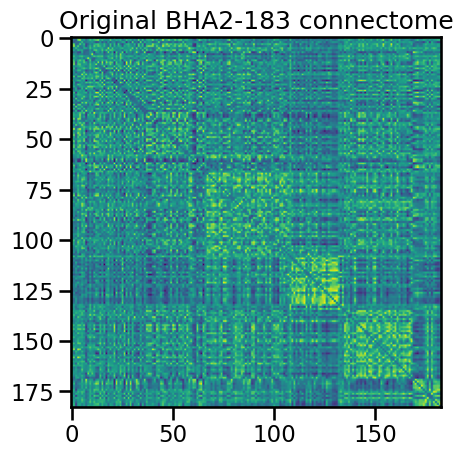

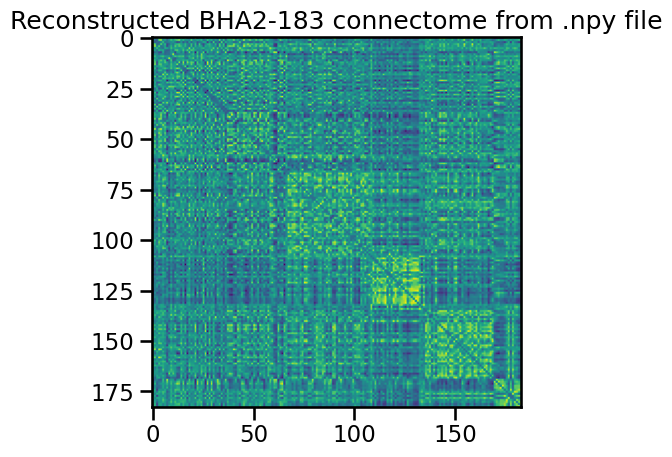

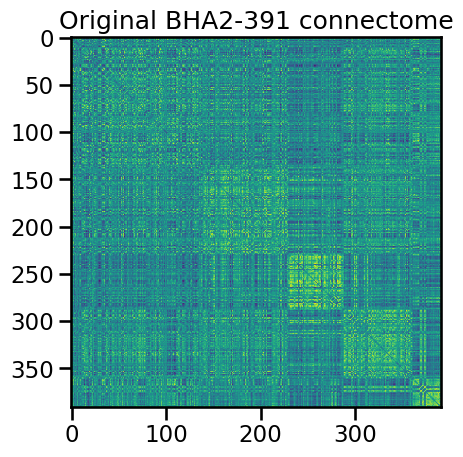

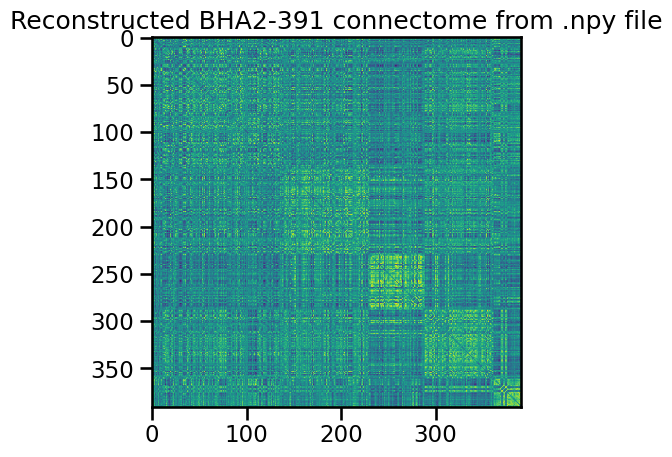

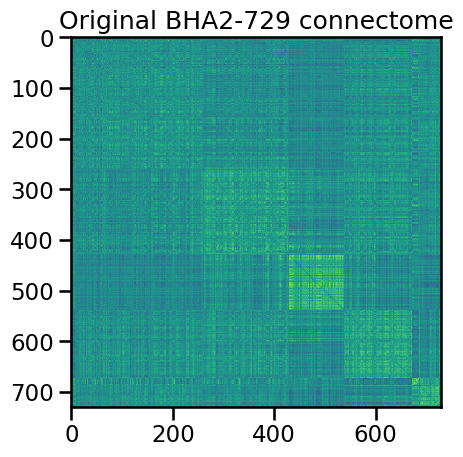

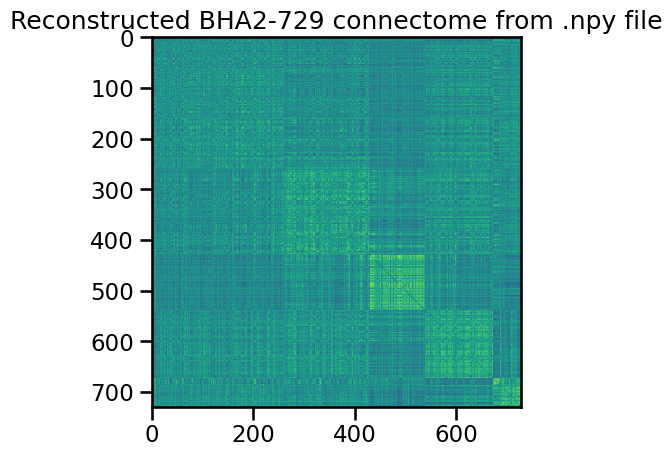

In [19]:
def process_and_verify_connectomes(connectomes, path, name):
    """
    Process connectomes, save upper triangle data, and verify reconstruction.
    
    Args:
        connectomes: List of connectome matrices
        path: Path to save .npy files
        name: Name of the parcellation (e.g. 'BHA2-183')
    """
    # Plot first connectome
    sub0_connectome = connectomes[0]
    plt.figure()
    plt.imshow(sub0_connectome)
    plt.title(f"Original {name} connectome")

    # Load first subject's connectome from saved .npy file using memory mapping
    connectomes_upper = np.load(f'{path}/npy/connectomes_upper.npy', mmap_mode='r')
    sub0_connectome_from_file = connectomes_upper[0]
    print(f"{name} shape:", sub0_connectome_from_file.shape)

    # Reconstruct full symmetric connectome from upper triangle
    n = int((1 + np.sqrt(1 + 8*len(sub0_connectome_from_file)))/2)
    reconstructed = np.zeros((n,n))
    idx = np.triu_indices(n, k=1)
    reconstructed[idx] = sub0_connectome_from_file
    reconstructed = reconstructed + reconstructed.T

    plt.figure()
    plt.imshow(reconstructed)
    plt.title(f"Reconstructed {name} connectome from .npy file")

    # Get indices of upper triangle
    triu_rows, triu_cols = np.triu_indices(n, k=1)

    # Create dictionary mapping (row,col) tuples to 1D array indices
    idx_map = {(i,j): idx for idx, (i,j) in enumerate(zip(triu_rows, triu_cols))}
    print(f"Number of upper triangle elements: {len(idx_map)}")

    # Save index mapping dictionary to file
    np.save(f'{path}/npy/upper_triangle_index_map.npy', idx_map)
    print(f"Saved upper triangle index mapping to {path}/npy/upper_triangle_index_map.npy")

    # Check all values match between reconstructed and memory mapped
    all_match = True
    for i in range(n):
        for j in range(i+1, n):  # Only check upper triangle
            # Get value from original connectome
            orig_value = reconstructed[i,j]
            
            # Get value from memory mapped file using index map
            mapped_idx = idx_map[(i,j)]
            mmap_value = sub0_connectome_from_file[mapped_idx]
            
            if not np.allclose(orig_value, mmap_value):
                print(f"Mismatch at edge ({i},{j}):")
                print(f"Original value: {orig_value:.4f}")
                print(f"Memory mapped value: {mmap_value:.4f}")
                all_match = False
                break
        if not all_match:
            break

    print(f"\nChecking all values in upper triangle for {name}:")
    print(f"All values match: {all_match}")

# Process each BHA2 parcellation
process_and_verify_connectomes(BHA2_183_connectomes, BHA2_183_path, 'BHA2-183')
process_and_verify_connectomes(BHA2_391_connectomes, BHA2_391_path, 'BHA2-391') 
process_and_verify_connectomes(BHA2_729_connectomes, BHA2_729_path, 'BHA2-729')


### Plot random connectomes

In [49]:
def plot_random_connectomes(connectomes, n_rows, max_rois):
    """
    Plot a grid of random connectomes from the dataset.
    
    Args:
        connectomes: List of connectome matrices
        n_rows: Number of rows/columns in the grid (total plots will be n_rows^2)
        max_rois: Maximum number of ROIs to show in each connectome plot
    """
    # Create a figure with n_rows x n_rows subplots
    fig, axes = plt.subplots(n_rows, n_rows, figsize=(2*n_rows, 2*n_rows))
    
    # Convert list to numpy array and get random indices
    connectome_array = np.array(connectomes)
    n_plots = n_rows * n_rows
    random_indices = np.random.choice(len(connectome_array), size=n_plots, replace=False)
    
    # Plot each connectome in the grid
    for idx, ax in enumerate(axes.flat):
        # Get random connectome and plot first max_rois x max_rois portion
        connectome = connectome_array[random_indices[idx]][:max_rois, :max_rois]
        im = ax.imshow(connectome, cmap='RdBu_r', vmin=-0.8, vmax=0.8)
        ax.axis('off')  # Turn off axis labels
    
    # Add a colorbar that applies to all subplots
    fig.subplots_adjust(right=0.9)
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    
    plt.suptitle(f'{n_plots} Random UKBB Cortical Connectomes (rsFC)', y=0.92)
    plt.show()

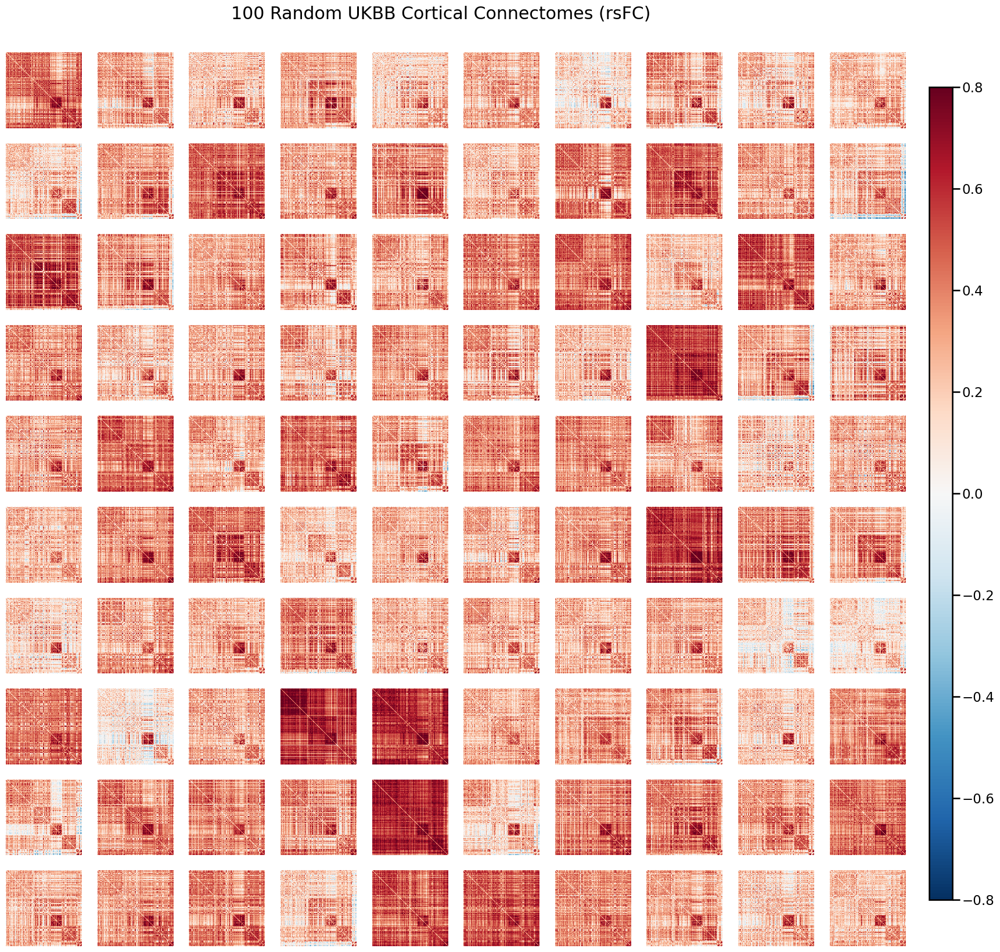

In [50]:
plot_random_connectomes(BHA2_183_connectomes, n_rows=10, max_rois=183)
#plot_random_connectomes(BHA2_391_connectomes, n_rows=10, max_rois=391)
#plot_random_connectomes(BHA2_729_connectomes, n_rows=10, max_rois=729)

In [53]:
def plot_connectome_with_networks(connectome_mu, network_labels=None, n_rois=None, title=None, parcellation=None):
    """
    Plot a connectome matrix with optional network labels and size limit.
    
    Args:
        connectome_mu: Average connectome matrix to plot
        network_labels: Optional list of network labels for each ROI
        n_rois: Optional number of ROIs to display (will show first n_rois x n_rois portion)
        title: Optional title for the plot. If None, uses default title.
        parcellation: Optional string indicating parcellation ('iPA_183', 'iPA_391', 'iPA_729')
    """
    plt.figure(figsize=(12, 10), dpi=200)
    
    # Limit connectome size if specified
    if n_rois is not None:
        connectome_mu = connectome_mu[:n_rois, :n_rois]
        if network_labels is not None:
            network_labels = network_labels[:n_rois]
    
    # Create the heatmap
    im = plt.imshow(connectome_mu, cmap='RdBu_r', vmin=-0.8, vmax=0.8)
    plt.colorbar()

    if network_labels is not None:
        # Draw lines between different adjacent labels
        prev_label = network_labels[0]
        for i in range(1, len(network_labels)):
            if network_labels[i] != prev_label:
                plt.axhline(y=i-0.5, color='black', linewidth=0.5)
                plt.axvline(x=i-0.5, color='black', linewidth=0.5)
                prev_label = network_labels[i]
        
        # Create tick positions and labels
        tick_positions = []
        tick_labels = []
        start_idx = 0
        prev_label = network_labels[0]
        
        for i in range(1, len(network_labels)):
            if network_labels[i] != prev_label:
                tick_positions.append((start_idx + i - 1) / 2)
                tick_labels.append(prev_label)
                start_idx = i
                prev_label = network_labels[i]
        
        # Add the last group
        tick_positions.append((start_idx + len(network_labels) - 1) / 2)
        tick_labels.append(prev_label)

        plt.xticks(tick_positions, tick_labels, rotation=45, ha='right')
        plt.yticks(tick_positions, tick_labels)

    else:
        # Add numerical ticks every 20 ROIs (or 10 if total ROIs <= 100)
        total_rois = connectome_mu.shape[0]
        tick_interval = 20 if total_rois <= 200 else 50
        tick_positions = np.arange(0, total_rois, tick_interval)
        plt.xticks(tick_positions, tick_positions)
        plt.yticks(tick_positions, tick_positions)

    if title is None:
        if parcellation:
            title = f'Average BHA2 Connectome ({parcellation}, rsFC)'
        else:
            title = 'Average BHA2 Connectome (rsFC)'
    plt.title(title)
    plt.tight_layout()
    plt.show()


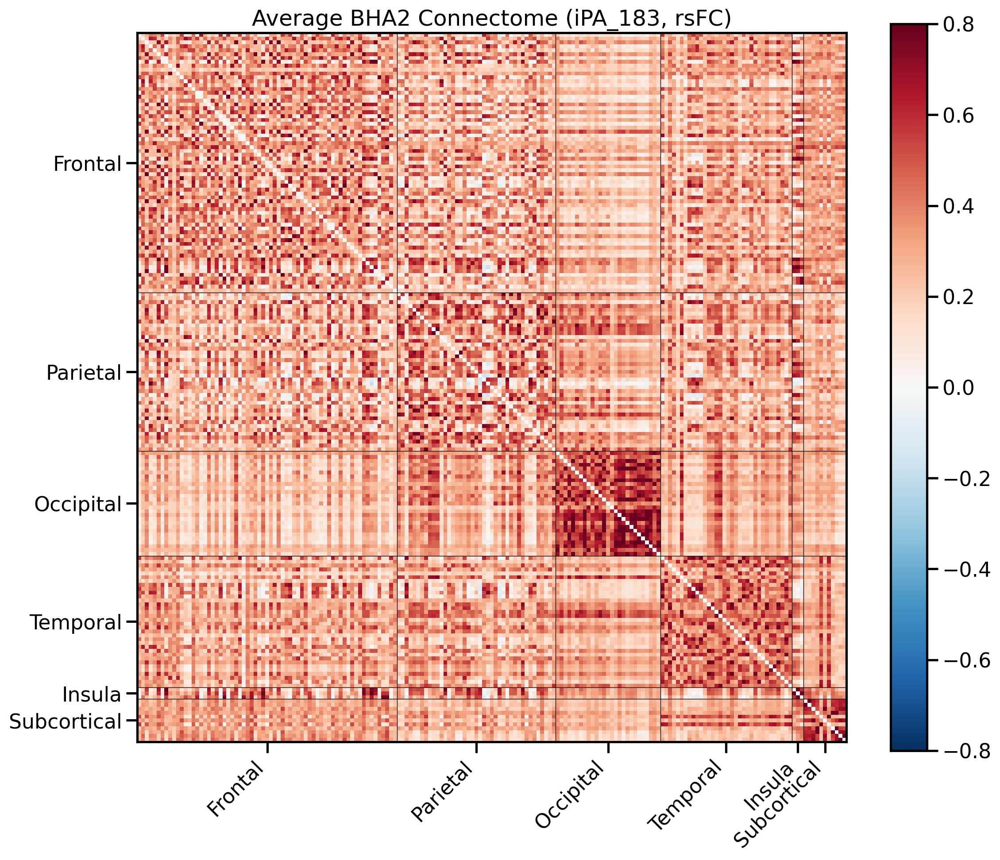

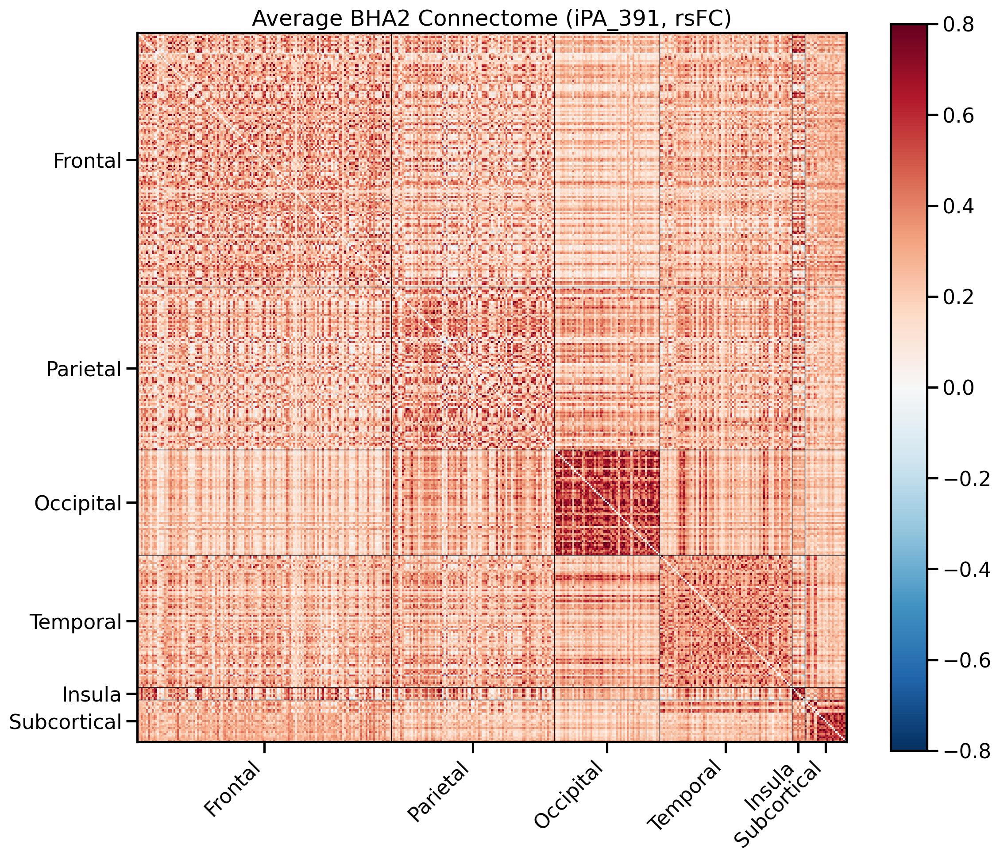

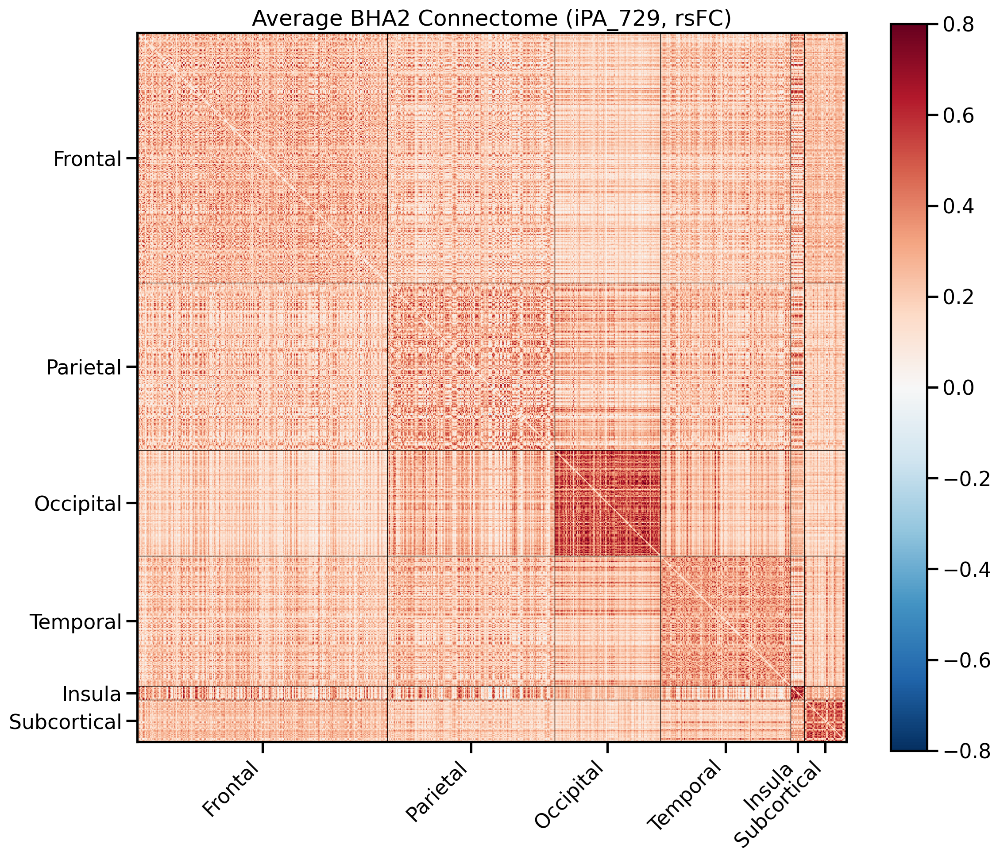

In [56]:
plot_connectome_with_networks(BHA2_183_connectome_mu, network_labels=iPA_183_network_labels, parcellation='iPA_183')
plot_connectome_with_networks(BHA2_391_connectome_mu, network_labels=iPA_391_network_labels, parcellation='iPA_391')
plot_connectome_with_networks(BHA2_729_connectome_mu, network_labels=iPA_729_network_labels, parcellation='iPA_729')


## Evaluate stability

### Correlations

In [57]:
def calculate_connectome_correlations(connectomes):
    """
    Calculate correlations between each connectome and the population average.
    
    Args:
        connectomes (list): List of individual subject connectome matrices
        
    Returns:
        tuple: (mean correlation, overall p-value) if valid correlations exist,
               (None, None) otherwise
    """
    # Convert list of connectomes to array and calculate population average
    connectome_array = np.array(connectomes)
    pop_avg = np.mean(connectome_array, axis=0)
    
    # Calculate correlations between population average and each individual connectome
    correlations = []
    p_values = []
    for connectome in connectome_array:
        # Flatten the matrices to 1D arrays for correlation calculation
        pop_avg_flat = pop_avg.flatten()
        conn_flat = connectome.flatten()
        
        # Remove any pairs where either value is NaN or inf
        mask = ~(np.isnan(pop_avg_flat) | np.isnan(conn_flat) | 
                 np.isinf(pop_avg_flat) | np.isinf(conn_flat))
        pop_avg_clean = pop_avg_flat[mask]
        conn_clean = conn_flat[mask]
        
        if len(pop_avg_clean) > 0:  # Only calculate if we have valid data points
            try:
                # Calculate correlation and p-value
                corr, p_val = pearsonr(pop_avg_clean, conn_clean)
                print(f"Correlation: {corr:.3f}, p-value: {p_val:.3e}")
                correlations.append(corr)
                p_values.append(p_val)
            except Exception as e:
                print(f"Error calculating correlation: {str(e)}")
                continue

    if correlations:  # Only calculate statistics if we have valid correlations
        # Calculate mean correlation
        mean_corr = np.mean(correlations)
        # Calculate overall p-value using Fisher's method with all valid p-values
        overall_p = scipy.stats.combine_pvalues(p_values)[1]

        print(f"Mean correlation with population average: {mean_corr:.3f}")
        print(f"Overall p-value: {overall_p:.3e}")
        return mean_corr, overall_p
    else:
        print("No valid correlations could be calculated")
        return None, None

In [58]:
calculate_connectome_correlations(BHA2_183_connectomes)
calculate_connectome_correlations(BHA2_391_connectomes)
calculate_connectome_correlations(BHA2_729_connectomes)

Correlation: 0.695, p-value: 0.000e+00
Correlation: 0.717, p-value: 0.000e+00
Correlation: 0.650, p-value: 0.000e+00
Correlation: 0.694, p-value: 0.000e+00
Correlation: 0.634, p-value: 0.000e+00
Correlation: 0.724, p-value: 0.000e+00
Correlation: 0.523, p-value: 0.000e+00
Correlation: 0.679, p-value: 0.000e+00
Correlation: 0.718, p-value: 0.000e+00
Correlation: 0.714, p-value: 0.000e+00
Correlation: 0.768, p-value: 0.000e+00
Correlation: 0.680, p-value: 0.000e+00
Correlation: 0.682, p-value: 0.000e+00
Correlation: 0.702, p-value: 0.000e+00
Correlation: 0.718, p-value: 0.000e+00
Correlation: 0.731, p-value: 0.000e+00
Correlation: 0.737, p-value: 0.000e+00
Correlation: 0.715, p-value: 0.000e+00
Correlation: 0.709, p-value: 0.000e+00
Correlation: 0.640, p-value: 0.000e+00
Correlation: 0.701, p-value: 0.000e+00
Correlation: 0.629, p-value: 0.000e+00
Correlation: 0.664, p-value: 0.000e+00
Correlation: 0.613, p-value: 0.000e+00
Correlation: 0.657, p-value: 0.000e+00
Correlation: 0.696, p-val

  statistic = -2 * np.sum(np.log(pvalues))



Mean correlation with population average: 0.677
Overall p-value: 0.000e+00
Correlation: 0.661, p-value: 0.000e+00
Correlation: 0.661, p-value: 0.000e+00
Correlation: 0.614, p-value: 0.000e+00
Correlation: 0.637, p-value: 0.000e+00
Correlation: 0.587, p-value: 0.000e+00
Correlation: 0.683, p-value: 0.000e+00
Correlation: 0.476, p-value: 0.000e+00
Correlation: 0.639, p-value: 0.000e+00
Correlation: 0.663, p-value: 0.000e+00
Correlation: 0.679, p-value: 0.000e+00
Correlation: 0.731, p-value: 0.000e+00
Correlation: 0.635, p-value: 0.000e+00
Correlation: 0.646, p-value: 0.000e+00
Correlation: 0.659, p-value: 0.000e+00
Correlation: 0.677, p-value: 0.000e+00
Correlation: 0.684, p-value: 0.000e+00
Correlation: 0.698, p-value: 0.000e+00
Correlation: 0.679, p-value: 0.000e+00
Correlation: 0.675, p-value: 0.000e+00
Correlation: 0.599, p-value: 0.000e+00
Correlation: 0.664, p-value: 0.000e+00
Correlation: 0.580, p-value: 0.000e+00
Correlation: 0.630, p-value: 0.000e+00
Correlation: 0.563, p-value:

(0.60602570615816, 0.0)

### Residuals

In [60]:
def compute_connectome_residuals(individual_connectomes, population_average, n_regions=None):
    """
    Compute residuals between individual connectomes and population average.
    
    Parameters:
    -----------
    individual_connectomes : list
        List of individual connectivity matrices
    population_average : numpy.ndarray 
        Population average connectivity matrix
    n_regions : int, optional
        Number of regions to include in analysis. If None, uses all regions (default None)
        
    Returns:
    --------
    numpy.ndarray
        1D array of flattened residuals
    """
    # Get max number of regions from population average shape
    max_regions = population_average.shape[0]
    
    # Use all regions if n_regions not specified or is larger than max
    n_regions = min(n_regions, max_regions) if n_regions is not None else max_regions
    
    # Select subset of regions
    subset_connectomes = [conn[:n_regions, :n_regions] for conn in individual_connectomes]
    pop_avg_subset = population_average[:n_regions, :n_regions]
    
    print(f"Original connectome shape: {individual_connectomes[0].shape}")
    print(f"Subset connectome shape: {subset_connectomes[0].shape}")

    # Convert to numpy array and compute residuals
    connectome_array = np.array(subset_connectomes)
    residuals = connectome_array - pop_avg_subset

    # Flatten residuals into 1D array
    return residuals.flatten()

def plot_residual_distribution(all_residuals):
    """
    Plot distribution of residuals between individual connectomes and population average.
    Tests and visualizes if the distribution is Gaussian.
    
    Parameters:
    -----------
    all_residuals : numpy.ndarray
        1D array of flattened residuals
    """
    # Create figure
    plt.figure(figsize=(12, 6))
    
    # Plot histogram without KDE
    sns.histplot(all_residuals, kde=False, stat='density', bins=100)
    
    # Fit normal distribution and plot
    mu, std = np.nanmean(all_residuals), np.nanstd(all_residuals)
    
    plt.title('Distribution of Residuals All Connectomes vs. Population Average')
    plt.xlabel('Residual Value')
    plt.ylabel('Density')
    plt.legend()
    
    # Perform Shapiro-Wilk test for normality
    statistic, p_value = stats.shapiro(all_residuals[~np.isnan(all_residuals)])
    
    # Add summary statistics and normality test results as text
    stats_text = f'Mean: {mu:.3f}\n'
    stats_text += f'Std: {std:.3f}\n'
    
    stats_text += f'\nShapiro-Wilk Test:\n'
    stats_text += f'Statistic: {statistic:.3f}\n'
    stats_text += f'p-value: {p_value:.3e}\n'
    stats_text += f'Distribution is {"Normal" if p_value > 0.05 else "Not Normal"}'
    
    plt.text(0.95, 0.95, stats_text,
             transform=plt.gca().transAxes,
             verticalalignment='top',
             horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.show()

Original connectome shape: (183, 183)
Subset connectome shape: (183, 183)


  warnings.warn("p-value may not be accurate for N > 5000.")



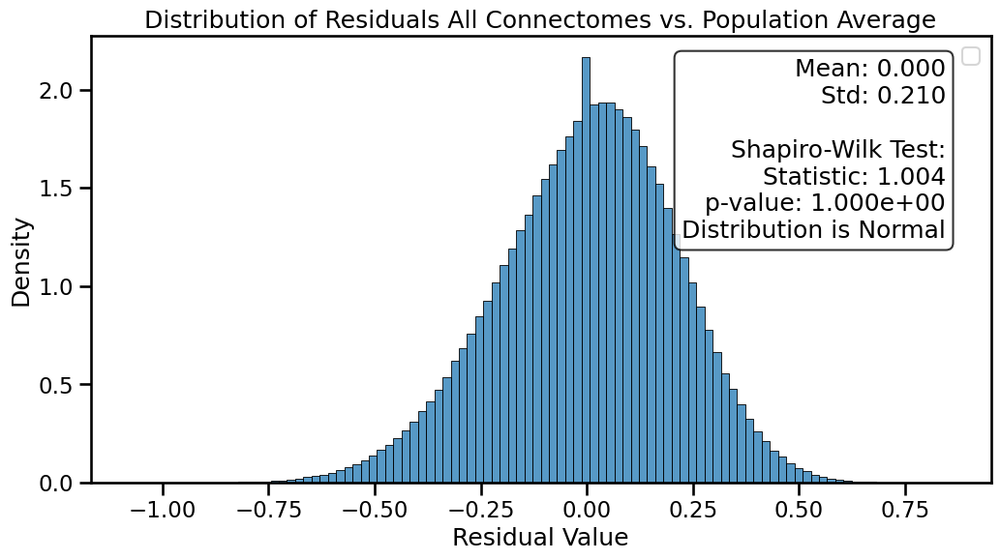

In [61]:
all_BHA2_183_residuals = compute_connectome_residuals(BHA2_183_connectomes, BHA2_183_connectome_mu)
# all_BHA2_391_residuals = compute_connectome_residuals(BHA2_391_connectomes, BHA2_391_connectome_mu)
# all_BHA2_729_residuals = compute_connectome_residuals(BHA2_729_connectomes, BHA2_729_connectome_mu)

plot_residual_distribution(all_BHA2_183_residuals)
# plot_residual_distribution(all_BHA2_391_residuals)
# plot_residual_distribution(all_BHA2_729_residuals)

In [13]:
def plot_random_edge_distribution(connectomes, max_regions, avg_connectome):
    """
    Plot distribution of values for a random edge in the connectome and test for normality.
    
    Parameters:
    -----------
    connectomes : list
        List of connectivity matrices
    max_regions : int
        Number of regions to subset (e.g. first 100)
    avg_connectome : numpy.ndarray
        Population average connectome matrix
    """
    # Convert to numpy array and subset
    connectome_array = np.array(connectomes)
    n_subjects = len(connectome_array)
    
    # Get random indices for row and column within max_regions
    row_idx = np.random.randint(0, max_regions)
    col_idx = np.random.randint(0, max_regions)
    
    # Get distribution of values for this edge across subjects
    edge_values = connectome_array[:, row_idx, col_idx]
    
    # Perform Shapiro-Wilk test for normality
    statistic, p_value = stats.shapiro(edge_values)
    
    # Get max possible range from population average
    max_abs_val = np.max(np.abs(avg_connectome))
    x_range = (-max_abs_val, max_abs_val)
    
    # Create figure
    plt.figure(figsize=(10, 6))
    
    # Plot histogram with KDE
    sns.histplot(edge_values, kde=True, stat='count', bins=30)
    plt.xlim(x_range)
    
    # Add vertical line for population average
    avg_value = avg_connectome[row_idx, col_idx]
    plt.axvline(x=avg_value, color='r', linestyle='--', 
                label=f'Population Average: {avg_value:.3f}')
    
    plt.title(f'Distribution of Edge Values for Regions ({row_idx}, {col_idx})')
    plt.xlabel('Connectivity Value')
    plt.ylabel('Count')
    plt.legend()
    
    # Adjust layout to prevent text cutoff
    plt.tight_layout()
    plt.subplots_adjust(right=0.85)
    plt.show()

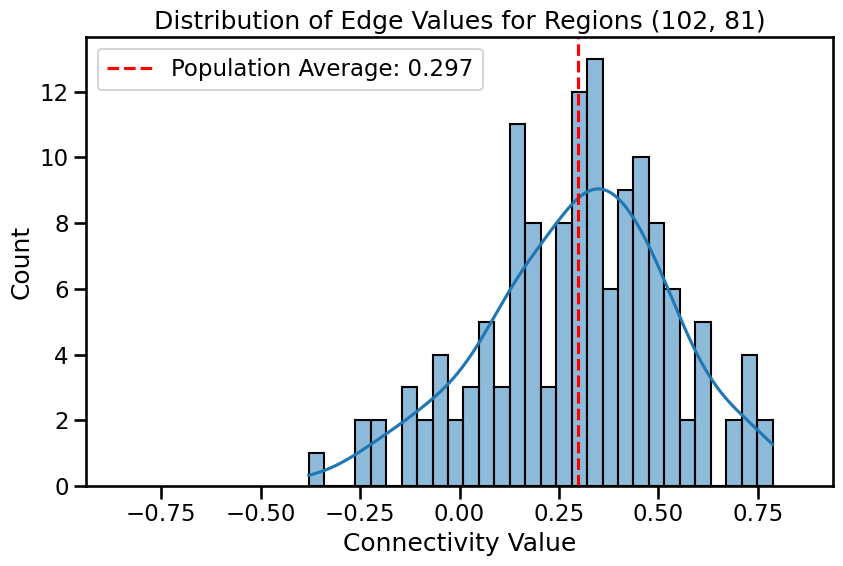

In [14]:
plot_random_edge_distribution(BHA2_183_connectomes, 183, BHA2_183_connectome_mu)

### Connectome subset KDEs

In [15]:
def plot_edge_distributions(connectomes, starting_roi, next_rois, avg_connectome):
    """
    Plot KDE distributions for all edges in the upper triangle of the connectome.
    
    Parameters:
    -----------
    connectomes : list
        List of connectivity matrices
    starting_roi : int
        Starting ROI index (0-based)
    next_rois : int
        Number of subsequent ROIs to plot
    avg_connectome : numpy.ndarray
        Population average connectome matrix
    """
    # Convert to numpy array and subset
    connectome_array = np.array(connectomes)
    n_subjects = len(connectome_array)
    
    # Calculate ending ROI index
    end_roi = starting_roi + next_rois
    
    # First plot the subsetted connectome
    subset_connectome = avg_connectome[starting_roi:end_roi, starting_roi:end_roi]
    
    # Create mask for upper triangle
    mask = np.tril(np.ones_like(subset_connectome))
    
    # Create masked array
    masked_connectome = np.ma.array(subset_connectome, mask=mask)
    
    plt.figure(figsize=(12, 10), dpi=200)
    plt.imshow(masked_connectome, cmap='RdBu_r', vmin=-0.8, vmax=0.8)
    plt.colorbar()
    plt.title(f'Average Cortical Connectome Subset (ROIs {starting_roi}-{end_roi-1})')
    
    # Set integer ticks
    plt.xticks(range(0, next_rois, 5), range(starting_roi, end_roi, 5))
    plt.yticks(range(0, next_rois, 5), range(starting_roi, end_roi, 5))
    
    plt.show()
    
    # KDE part
    # Create figure with subplots for upper triangle
    n_rows = next_rois - 1
    n_cols = next_rois - 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 24))  # Made height equal to width
    
    # Get max possible range from population average for consistent scaling
    max_abs_val = np.max(np.abs(avg_connectome))
    x_range = (-max_abs_val, max_abs_val)
    
    # Plot KDE for each edge in upper triangle
    plot_idx = 0
    for i in range(starting_roi, end_roi):
        for j in range(i+1, end_roi):
            # Get row and column index in subplot grid
            row = i - starting_roi
            col = j - starting_roi - 1
            
            # Get distribution of values for this edge across subjects
            edge_values = connectome_array[:, i, j]
            
            # Get average value for background color
            avg_value = avg_connectome[i, j]
            
            # Set background color based on average value
            axes[row, col].set_facecolor(plt.cm.RdBu_r((avg_value + 1) / 2))
            
            # Plot KDE with thicker lines and black border
            sns.kdeplot(edge_values, ax=axes[row, col], color='black', linewidth=5)  # Increased from 3 to 5
            axes[row, col].spines['top'].set_visible(True)
            axes[row, col].spines['right'].set_visible(True)
            axes[row, col].spines['bottom'].set_visible(True)
            axes[row, col].spines['left'].set_visible(True)
            axes[row, col].spines['top'].set_color('black')
            axes[row, col].spines['right'].set_color('black')
            axes[row, col].spines['bottom'].set_color('black')
            axes[row, col].spines['left'].set_color('black')
            axes[row, col].spines['top'].set_linewidth(2)
            axes[row, col].spines['right'].set_linewidth(2)
            axes[row, col].spines['bottom'].set_linewidth(2)
            axes[row, col].spines['left'].set_linewidth(2)
            axes[row, col].set_xlim(x_range)
            
            # Make subplot square by setting aspect ratio to 'equal'
            axes[row, col].set_aspect(1.0/axes[row, col].get_data_ratio())
            
            # Add vertical line for population average with thicker line
            axes[row, col].axvline(x=avg_value, color='blue', linestyle='--', linewidth=5)  # Increased from 3 to 5
            
            # Remove all labels and ticks
            axes[row, col].set_xticks([])
            axes[row, col].set_yticks([])
            axes[row, col].set_xlabel('')
            axes[row, col].set_ylabel('')
            
            plot_idx += 1
    
    # Remove empty subplots in lower triangle
    for i in range(n_rows):
        for j in range(n_cols):
            if j <= i:
                axes[i,j].remove()
    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

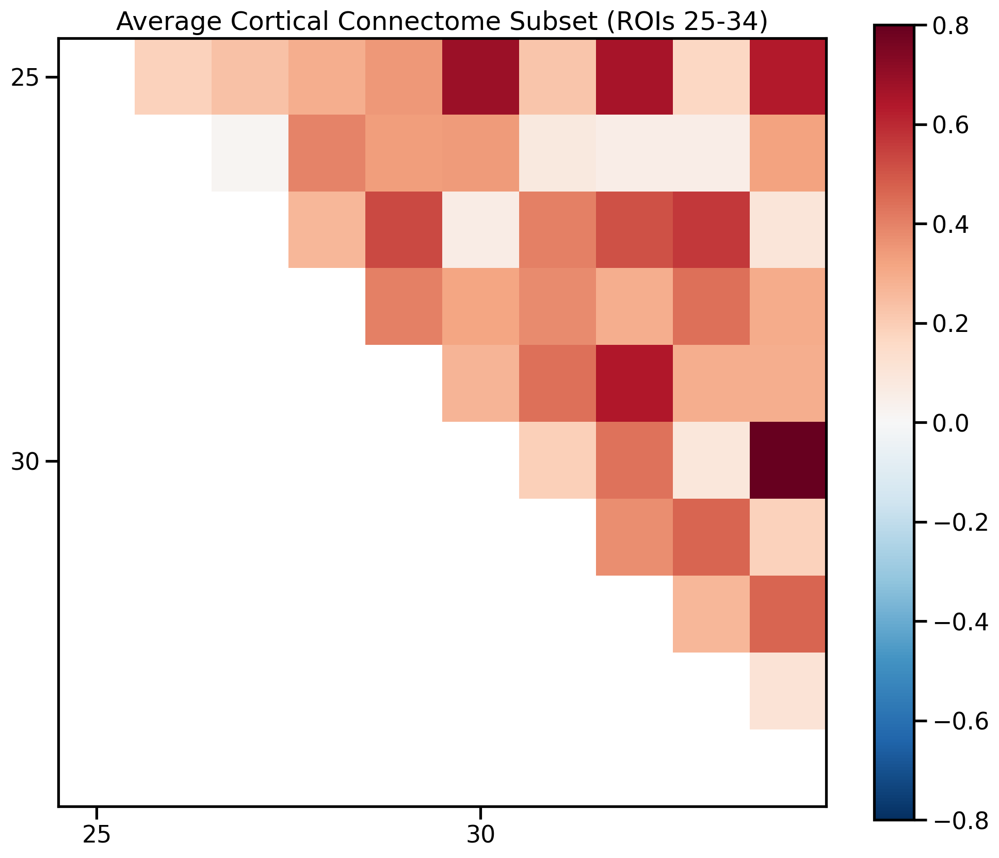

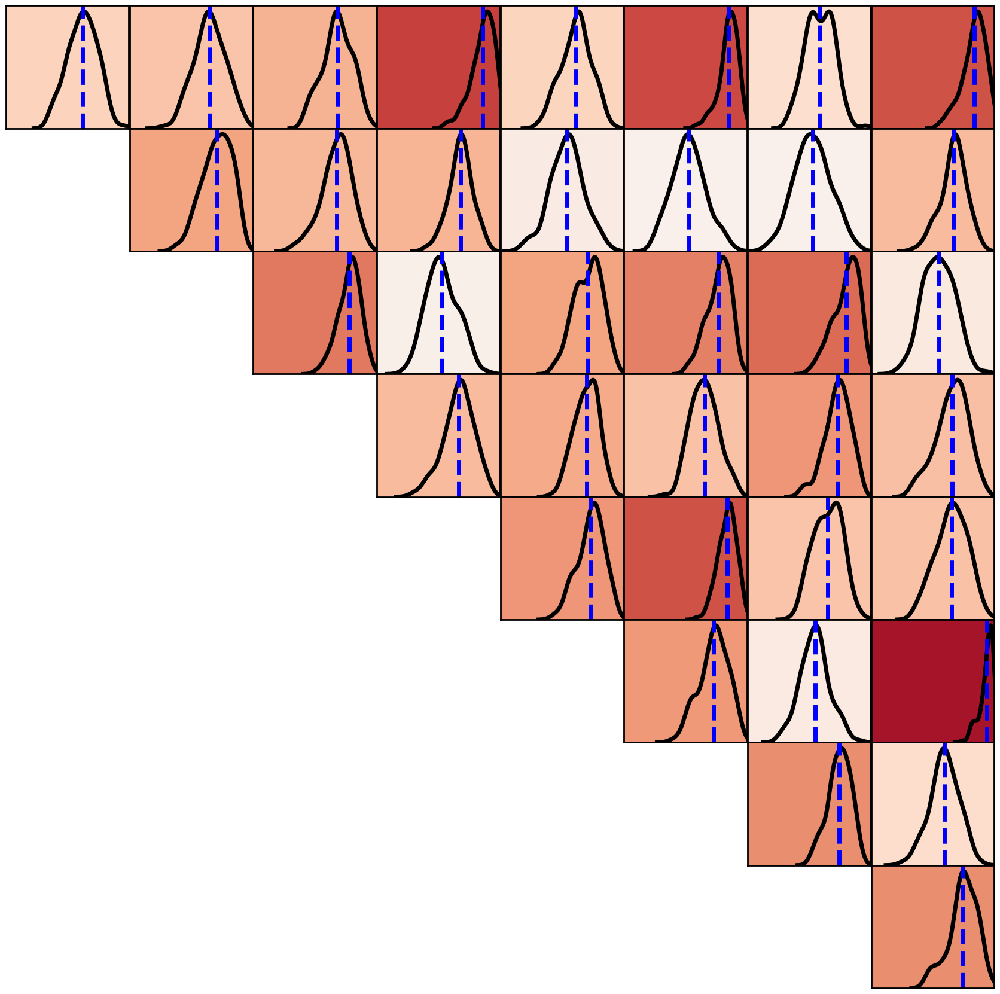

In [16]:
plot_edge_distributions(BHA2_183_connectomes, starting_roi=25, next_rois=10, avg_connectome=BHA2_183_connectome_mu)

In [17]:
def plot_edge_distributions_full(connectomes, starting_roi_y, starting_roi_x, next_rois, avg_connectome):
    """
    Plot KDE distributions for edges between two specified ranges of ROIs.
    
    Parameters:
    -----------
    connectomes : list
        List of connectivity matrices
    starting_roi_y : int
        Starting ROI index for y-axis (0-based)
    starting_roi_x : int
        Starting ROI index for x-axis (0-based) 
    next_rois : int
        Number of subsequent ROIs to plot on each axis
    avg_connectome : numpy.ndarray
        Population average connectome matrix
    """
    # Convert to numpy array and subset
    connectome_array = np.array(connectomes)
    n_subjects = len(connectome_array)
    
    # Calculate ending ROI indices
    end_roi_y = starting_roi_y + next_rois
    end_roi_x = starting_roi_x + next_rois
    
    # First plot the subsetted connectome
    subset_connectome = avg_connectome[starting_roi_y:end_roi_y, starting_roi_x:end_roi_x]
    
    plt.figure(figsize=(12, 10), dpi=200)
    plt.imshow(subset_connectome, cmap='RdBu_r', vmin=-0.8, vmax=0.8)
    plt.colorbar()
    plt.title(f'Average Cortical Connectome Subset\n(ROIs {starting_roi_y}-{end_roi_y-1} × {starting_roi_x}-{end_roi_x-1})')
    
    # Set integer ticks
    plt.xticks(range(0, next_rois, 5), range(starting_roi_x, end_roi_x, 5))
    plt.yticks(range(0, next_rois, 5), range(starting_roi_y, end_roi_y, 5))
    
    plt.show()
    
    # KDE part
    # Create figure with subplots for all connections between the two ranges
    n_rows = next_rois
    n_cols = next_rois
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 24))
    
    # Get max possible range from population average for consistent scaling
    max_abs_val = np.max(np.abs(avg_connectome))
    x_range = (-max_abs_val, max_abs_val)
    
    # Plot KDE for each edge between the two ranges
    for i in range(starting_roi_y, end_roi_y):
        for j in range(starting_roi_x, end_roi_x):
            # Get row and column index in subplot grid
            row = i - starting_roi_y
            col = j - starting_roi_x
            
            # Get distribution of values for this edge across subjects
            edge_values = connectome_array[:, i, j]
            
            # Get average value for background color
            avg_value = avg_connectome[i, j]
            
            # Set background color based on average value
            axes[row, col].set_facecolor(plt.cm.RdBu_r((avg_value + 1) / 2))
            
            # Plot KDE with thicker lines and black border
            sns.kdeplot(edge_values, ax=axes[row, col], color='black', linewidth=5)
            axes[row, col].spines['top'].set_visible(True)
            axes[row, col].spines['right'].set_visible(True)
            axes[row, col].spines['bottom'].set_visible(True)
            axes[row, col].spines['left'].set_visible(True)
            axes[row, col].spines['top'].set_color('black')
            axes[row, col].spines['right'].set_color('black')
            axes[row, col].spines['bottom'].set_color('black')
            axes[row, col].spines['left'].set_color('black')
            axes[row, col].spines['top'].set_linewidth(2)
            axes[row, col].spines['right'].set_linewidth(2)
            axes[row, col].spines['bottom'].set_linewidth(2)
            axes[row, col].spines['left'].set_linewidth(2)
            axes[row, col].set_xlim(x_range)
            
            # Make subplot square by setting aspect ratio to 'equal'
            axes[row, col].set_aspect(1.0/axes[row, col].get_data_ratio())
            
            # Add vertical line for population average with thicker line
            axes[row, col].axvline(x=avg_value, color='blue', linestyle='--', linewidth=5)
            
            # Remove all labels and ticks
            axes[row, col].set_xticks([])
            axes[row, col].set_yticks([])
            axes[row, col].set_xlabel('')
            axes[row, col].set_ylabel('')
    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

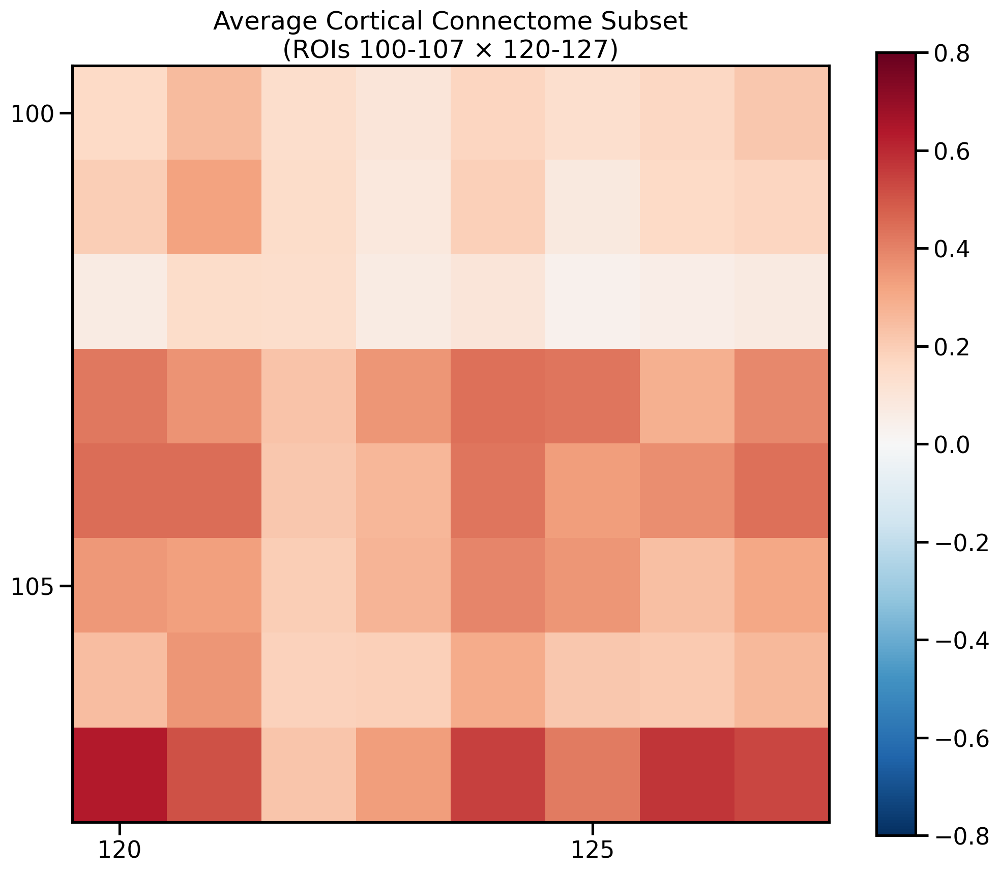

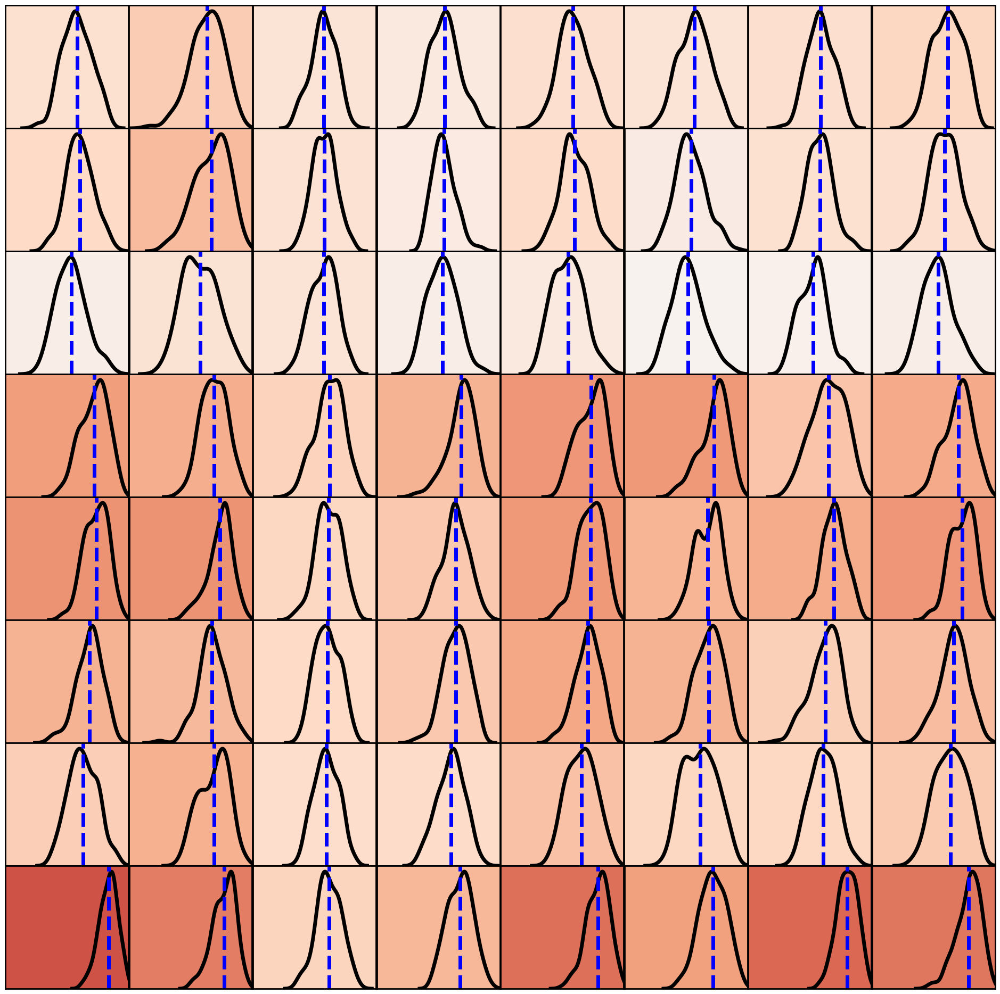

In [18]:
plot_edge_distributions_full(BHA2_183_connectomes, 100, 120, 8, BHA2_183_connectome_mu)